In [1]:
import pandas as pd
from hdfs import InsecureClient
from matplotlib import pyplot as plt
import numpy as np
import os
from functools import reduce
import datetime as dt
import matplotlib.dates as md
headers = ["timestamp", "value"]
plt.rcParams.update({'font.size': 14})

In [2]:
def plotThroughput(file, k):
    table = pd.read_csv(file, header=None, sep=",", names=['nodeID','timestamp','events'])

    #table

    dfs = []
    for i in range(k):
        dfs.append(table[(table['nodeID'] == i)][['timestamp','events']])

    merged = reduce(lambda left,right: pd.merge(left, right, on='timestamp', how='outer').sort_values(by='timestamp'), dfs)

    merged
    cols = ['timestamp']
    for i in range(k):
        cols.append(str(i))

    merged.columns = cols

    y = []
    for i in range(k):
        y.append(merged[str(i)].fillna(method='ffill'))

    # define x axis starting from 0
    firstTs = merged['timestamp'].iloc[0]

    x_axis_from_0 = (merged['timestamp'] - firstTs)/1000

    # compute throughput = events / elapsedTime
    for i in range(k):
        merged[str(i)] /= x_axis_from_0

    plt.figure(figsize=(15,5))
    ax=plt.gca()
    for i in range(k):
        plt.plot(x_axis_from_0, y[i], label=i)
    plt.title('# Events by elapsed time')
    plt.xlabel('Processing Time (sec)')
    plt.ylabel('# Events')
    plt.legend()

    # recompute y
    y = []
    for i in range(k):
        y.append(merged[str(i)].fillna(method='ffill'))
        
    plt.figure(figsize=(15,5))
    ax=plt.gca()
    for i in range(k):
        plt.plot(x_axis_from_0, y[i], label=i)
    plt.title('Events/sec by elapsed time')
    plt.xlabel('Processing Time (sec)')
    plt.ylabel('Events/Second')
    plt.legend()

In [ ]:
def plotThroughput2(file, k):
    table = pd.read_csv(file, header=None, sep=",", names=['nodeID','timestamp','events'])

    #table

    dfs = []
    for i in range(k):
        dfs.append(table[(table['nodeID'] == i)][['timestamp','events']])

    merged = reduce(lambda left,right: pd.merge(left, right, on='timestamp', how='outer').sort_values(by='timestamp'), dfs)

    merged
    cols = ['timestamp']
    for i in range(k):
        cols.append(str(i))

    merged.columns = cols
    
    # define x axis starting from 0
    firstTs = merged['timestamp'].iloc[0]

    x_axis_from_0 = merged['timestamp'] - firstTs  

    # compute throughput = events / elapsedTime
    for i in range(k):
        merged[str(i)] /= x_axis_from_0/1000

    y = []
    for i in range(k):
        y.append(merged[str(i)].fillna(method='ffill'))

    plt.figure(figsize=(15,5))
    ax=plt.gca()
    for i in range(k):
        plt.plot(x_axis_from_0/1000, y[i], label=i)
    # ax.xaxis.set_major_formatter(xfmt)
    plt.title('Events/sec by elapsed time')
    plt.xlabel('Processing Time (sec)')
    plt.ylabel('Events/Second')
    plt.legend()

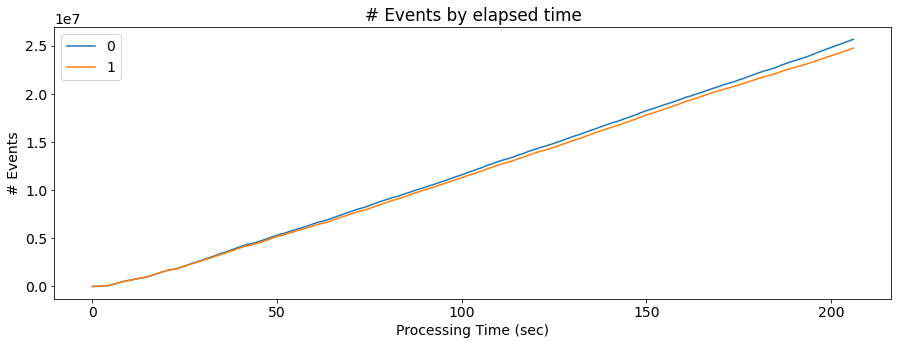

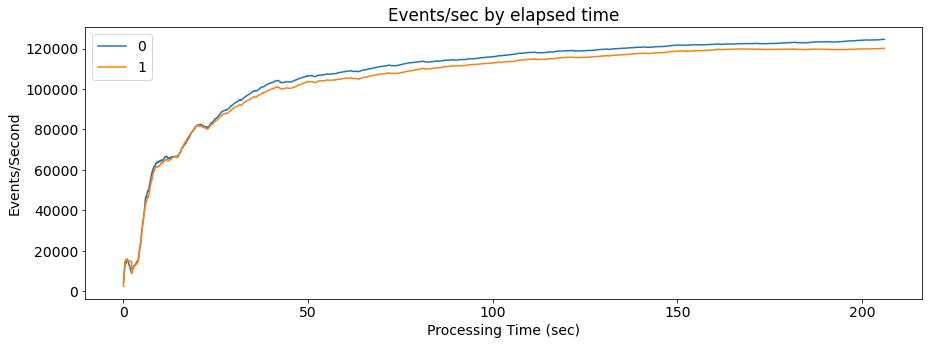

In [5]:
plotThroughput('cluster/throughput/throughput_e10_k2_norb_cr.txt', 2)

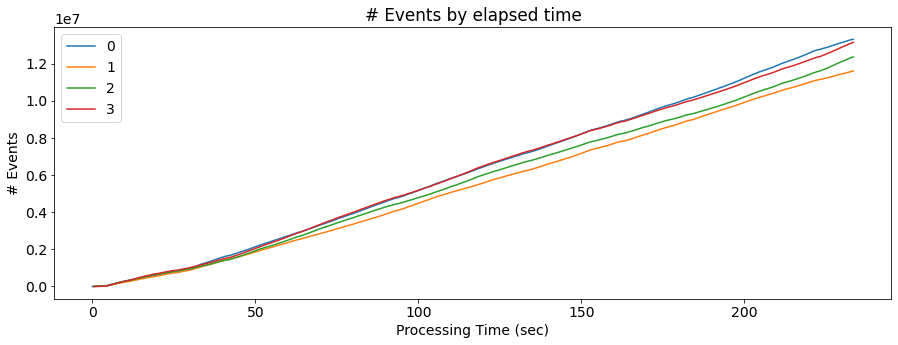

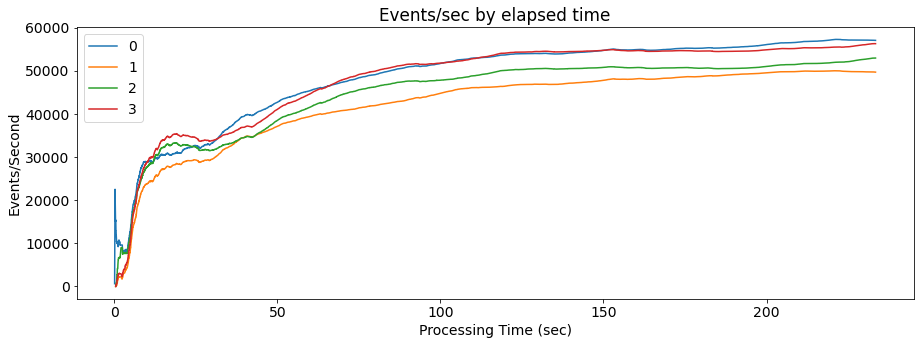

In [7]:
plotThroughput('cluster/throughput/throughput_e10_k4_norb_cr.txt', 4)

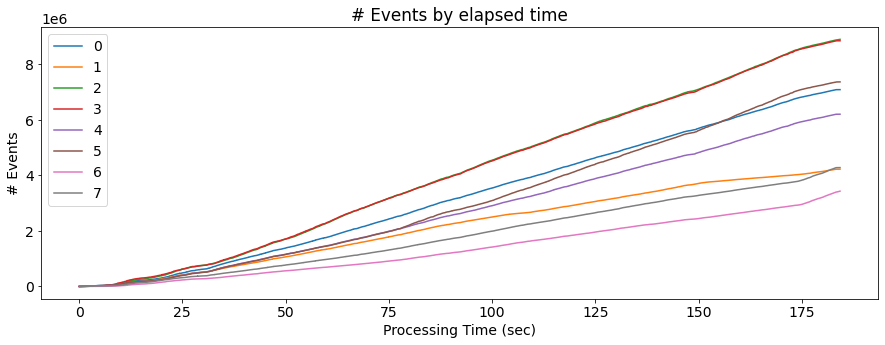

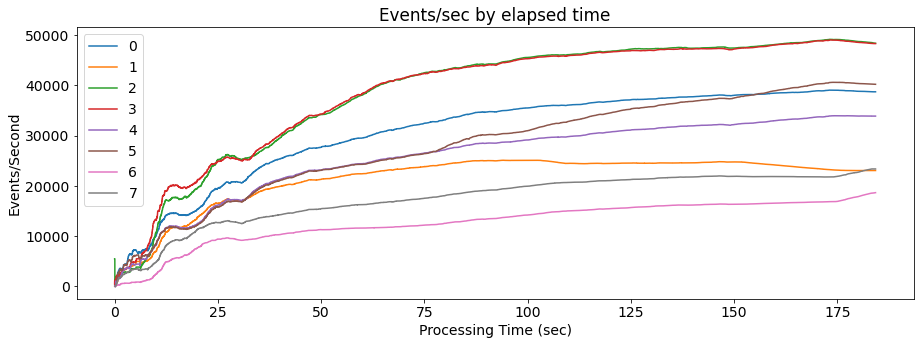

In [8]:
plotThroughput('cluster/throughput/throughput_e10_k8_norb_cr.txt', 8)

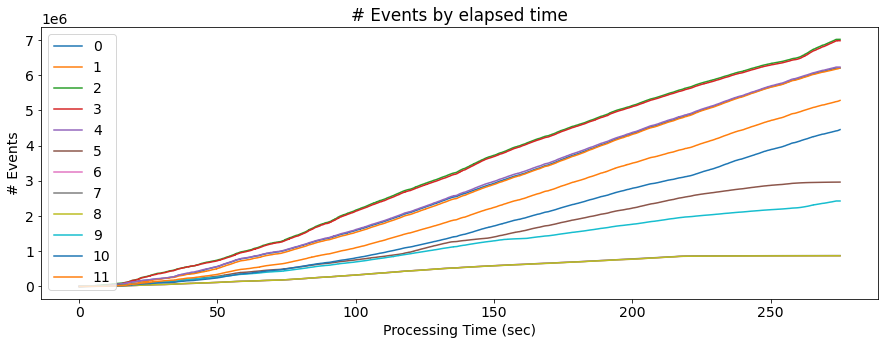

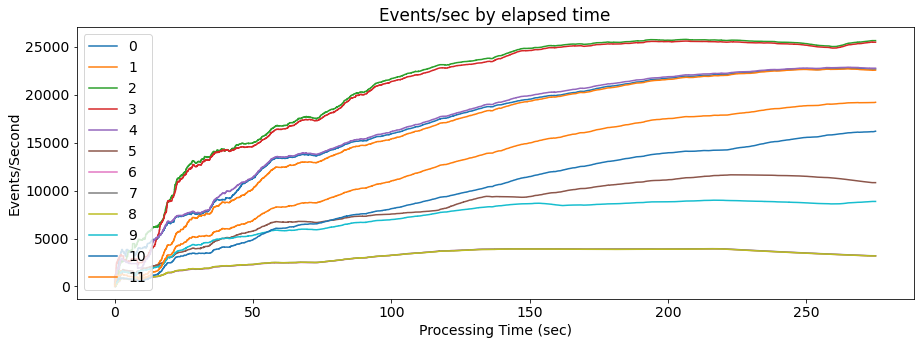

In [9]:
plotThroughput('cluster/throughput/throughput_e10_k12_norb_cr.txt', 12)

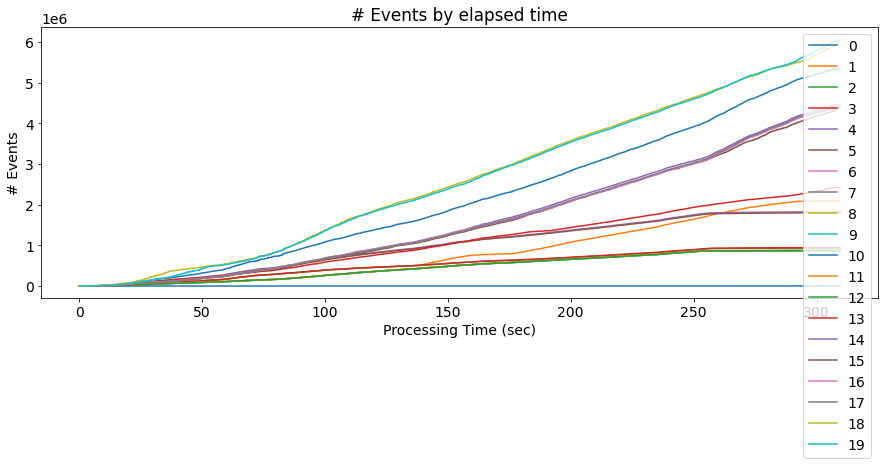

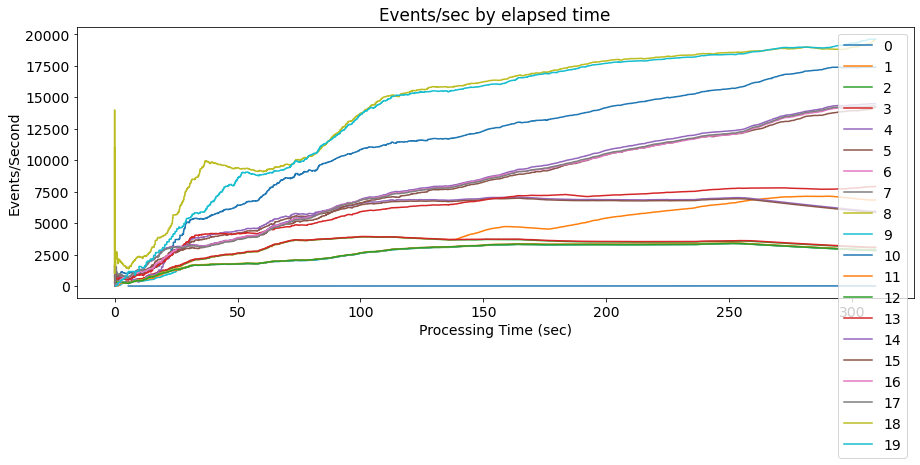

In [10]:
plotThroughput('cluster/throughput/throughput_e10_k20_norb_cr.txt', 20)

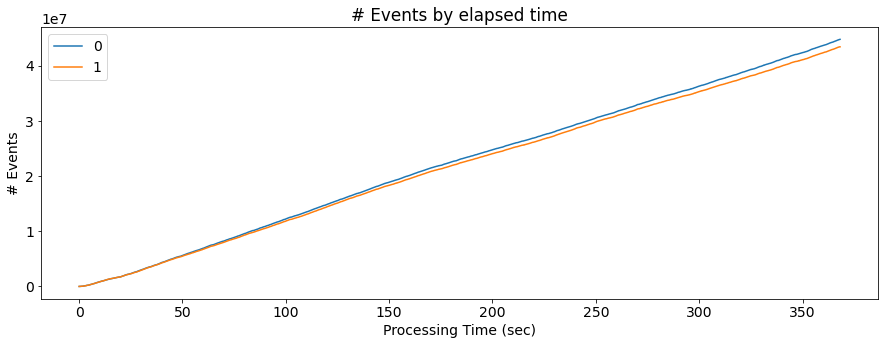

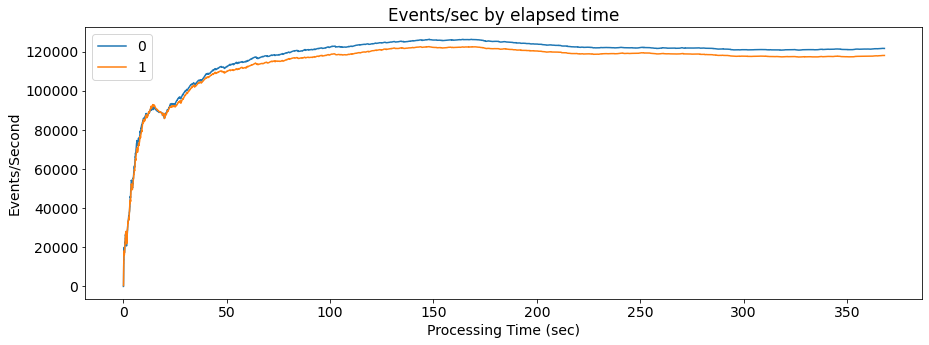

In [11]:
plotThroughput('cluster/throughput/throughput_e10_k2_norb_w.txt', 2)

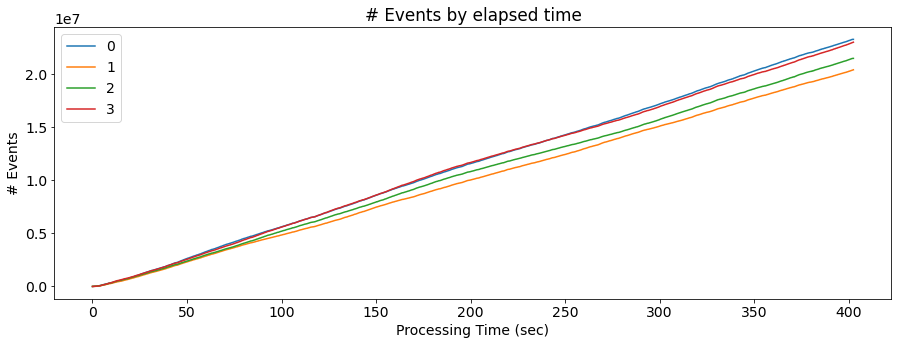

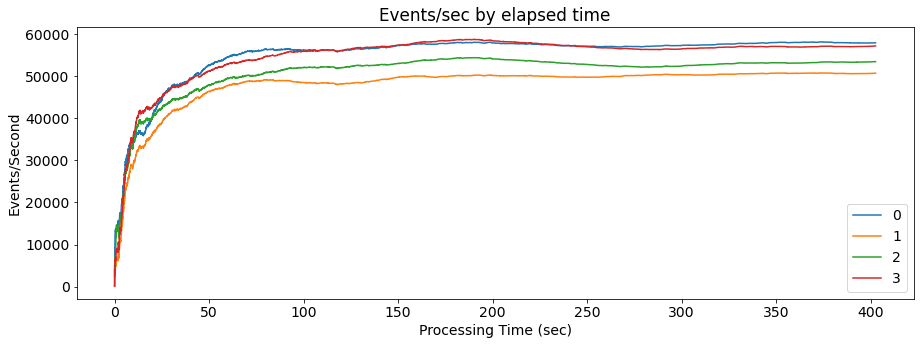

In [12]:
plotThroughput('cluster/throughput/throughput_e10_k4_norb_w.txt', 4)

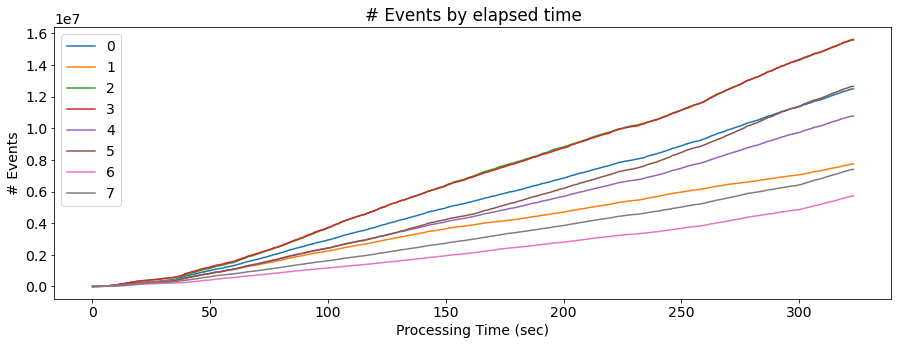

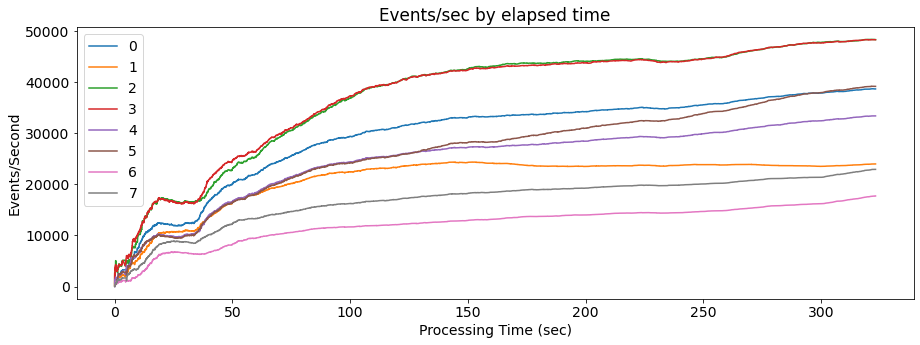

In [13]:
plotThroughput('cluster/throughput/throughput_e10_k8_norb_w.txt', 8)

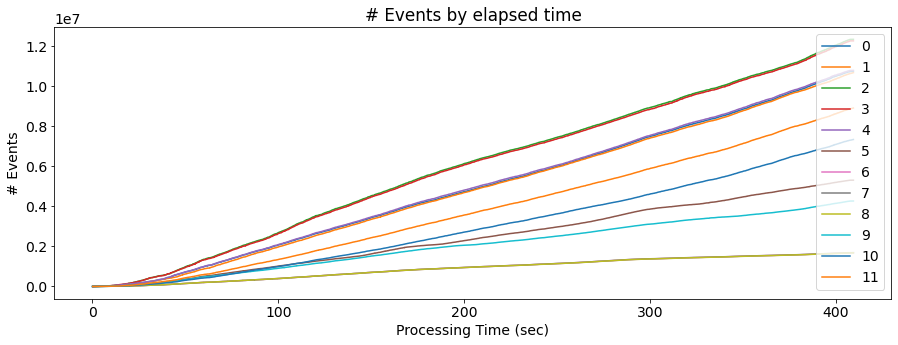

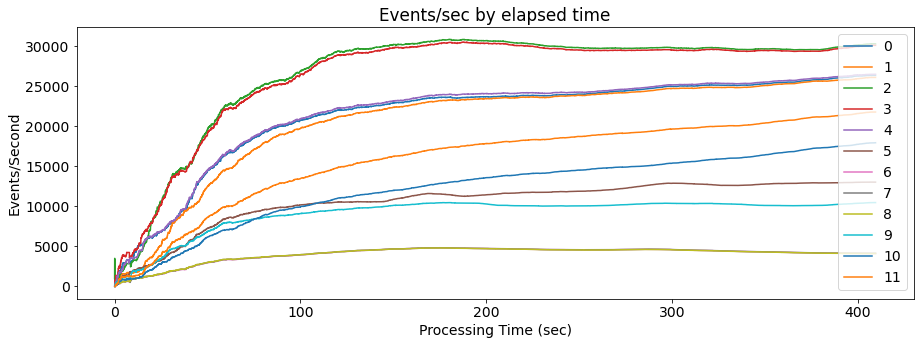

In [14]:
plotThroughput('cluster/throughput/throughput_e10_k12_norb_w.txt', 12)

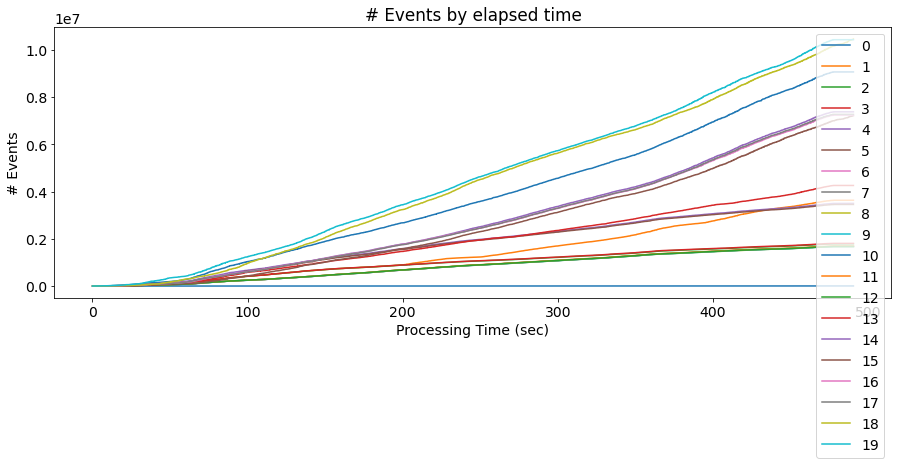

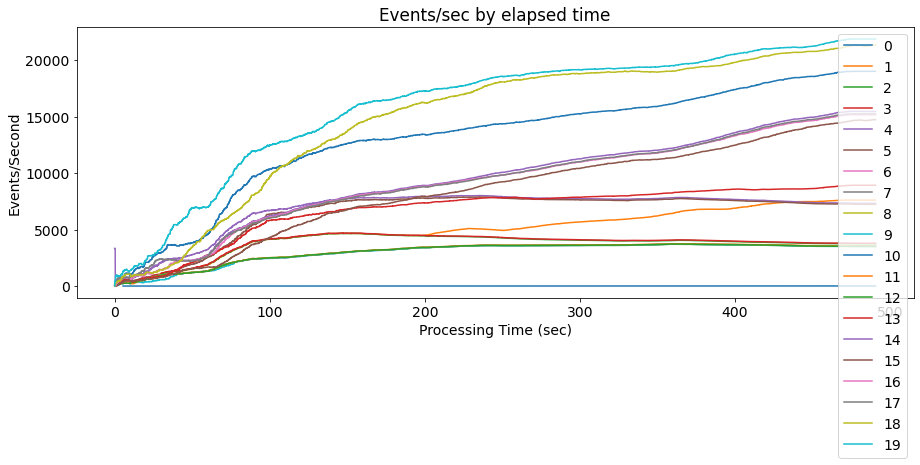

In [15]:
plotThroughput('cluster/throughput/throughput_e10_k20_norb_w.txt', 20)

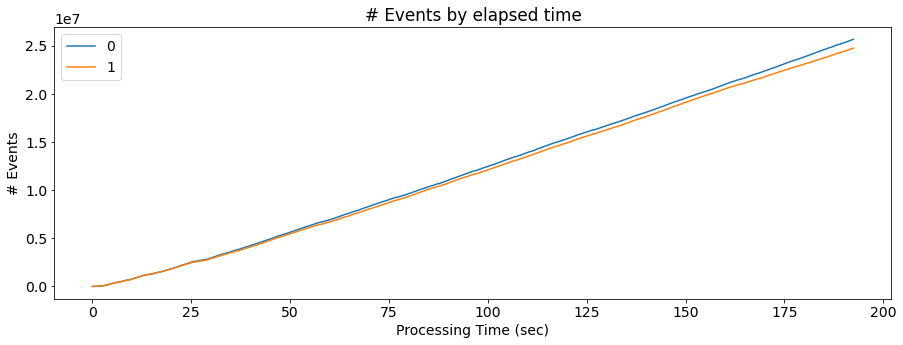

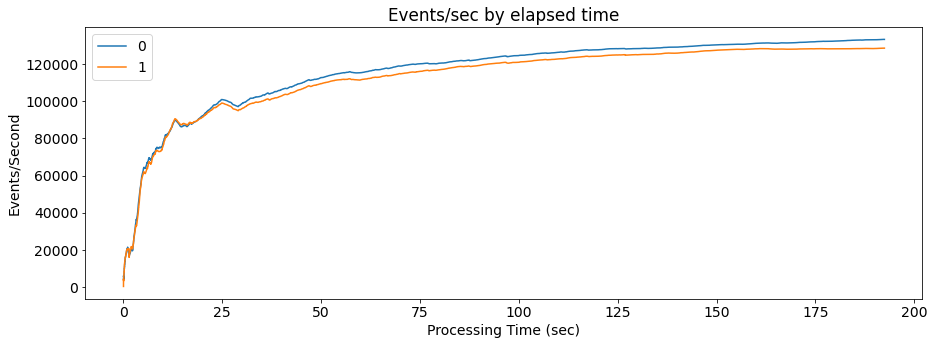

In [16]:
plotThroughput('cluster/throughput/throughput_e10_k2_rb_cr.txt', 2)

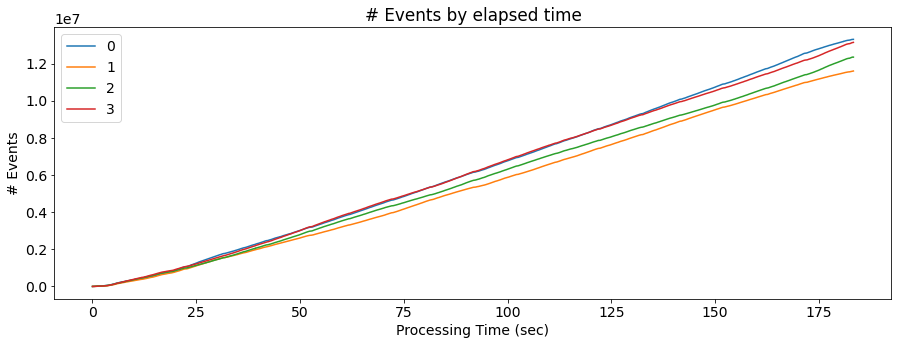

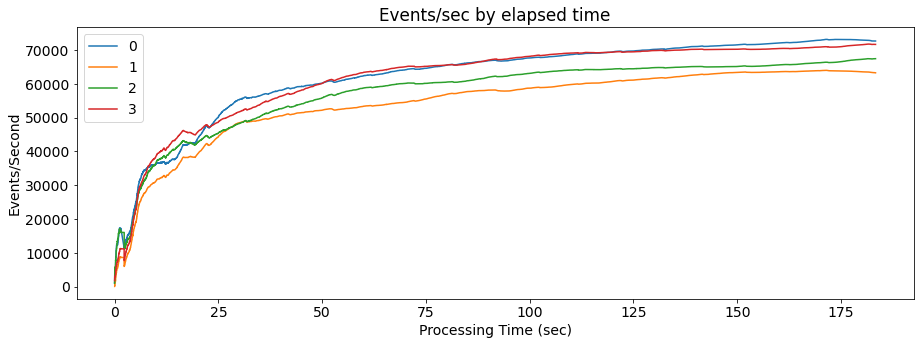

In [17]:
plotThroughput('cluster/throughput/throughput_e10_k4_rb_cr.txt', 4)

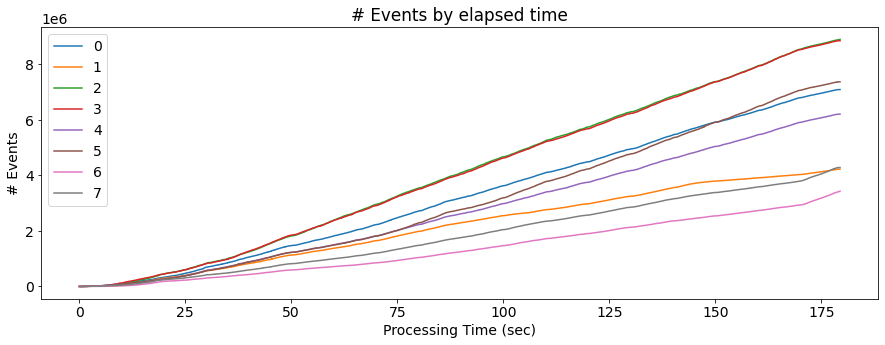

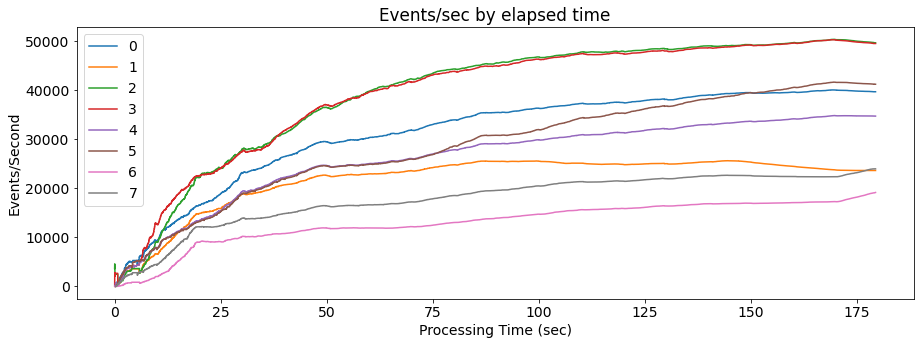

In [18]:
plotThroughput('cluster/throughput/throughput_e10_k8_rb_cr.txt', 8)

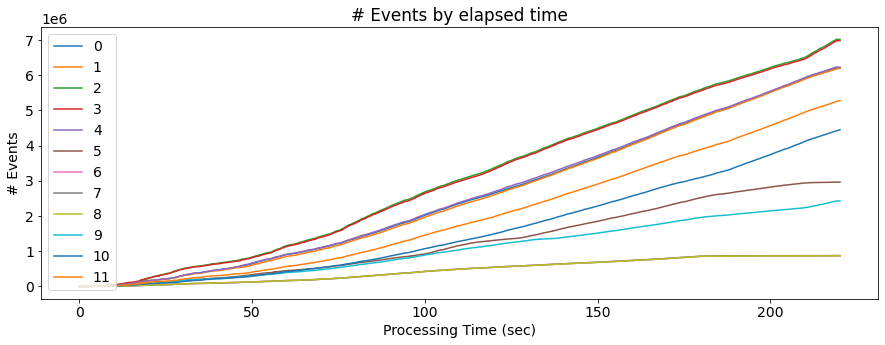

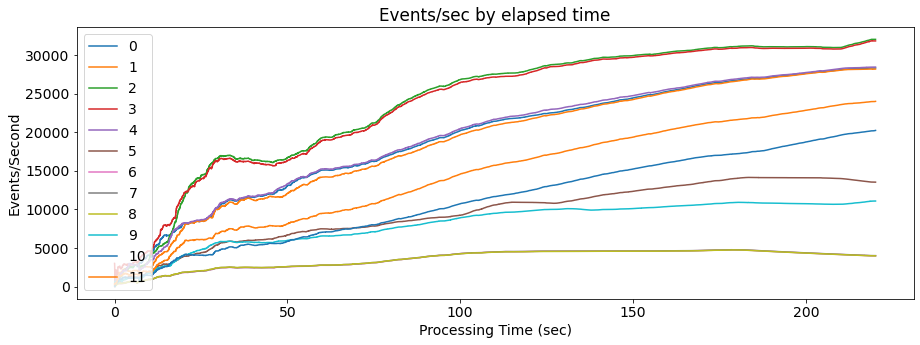

In [19]:
plotThroughput('cluster/throughput/throughput_e10_k12_rb_cr.txt', 12)

In [3]:
plotThroughput('cluster/throughput/throughput_e10_k20_rb_cr.txt', 20)

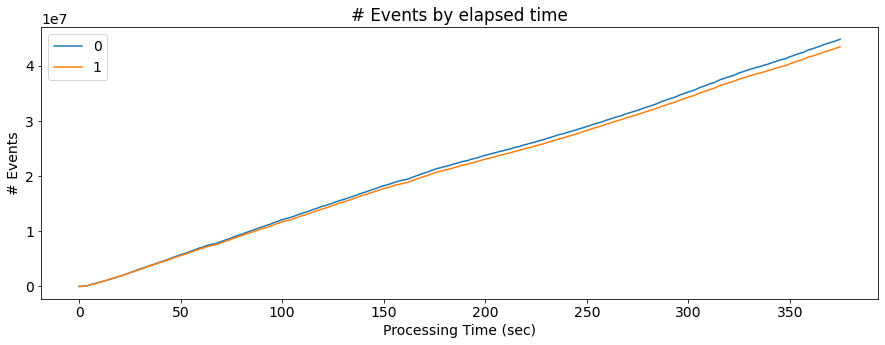

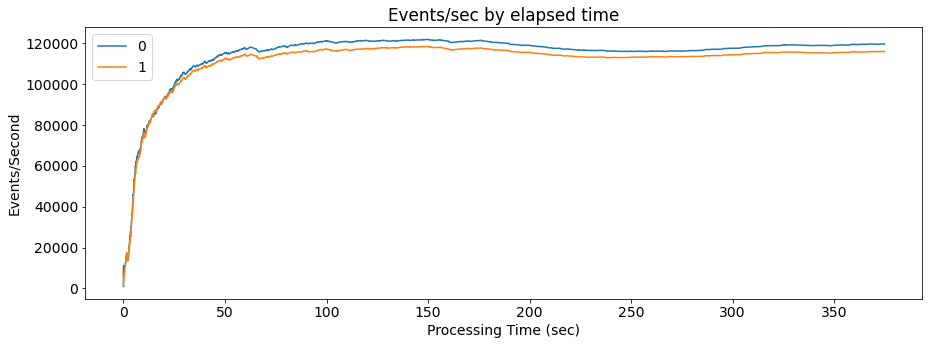

In [3]:
plotThroughput('cluster/throughput/throughput_e10_k2_rb_w.txt', 2)

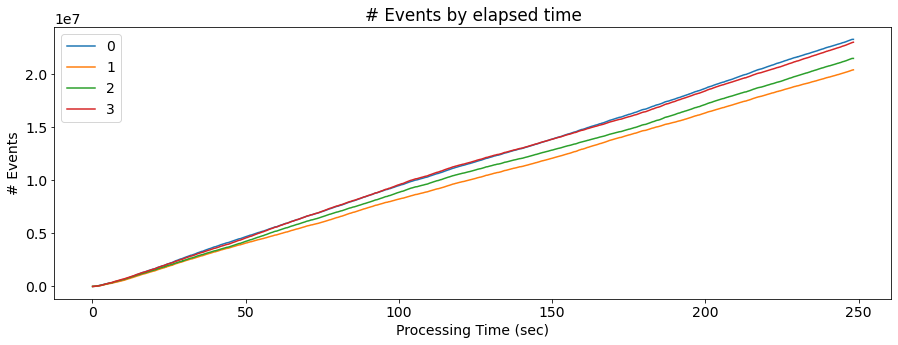

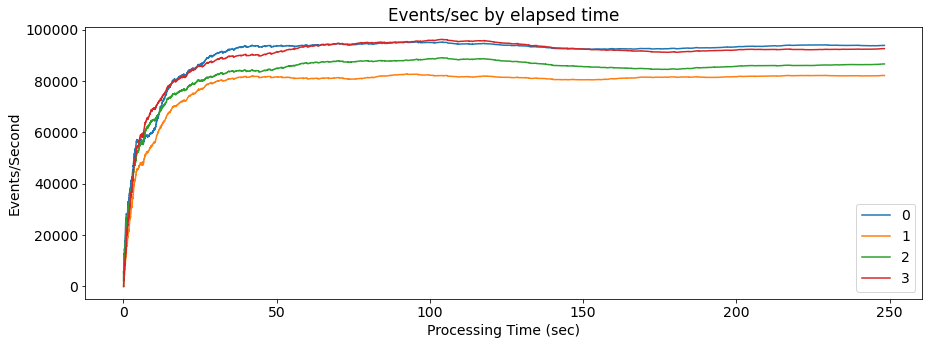

In [4]:
plotThroughput('cluster/throughput/throughput_e10_k4_rb_w.txt', 4)

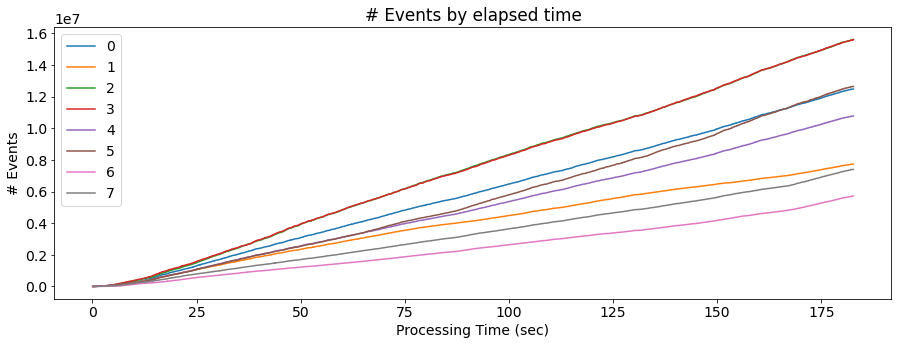

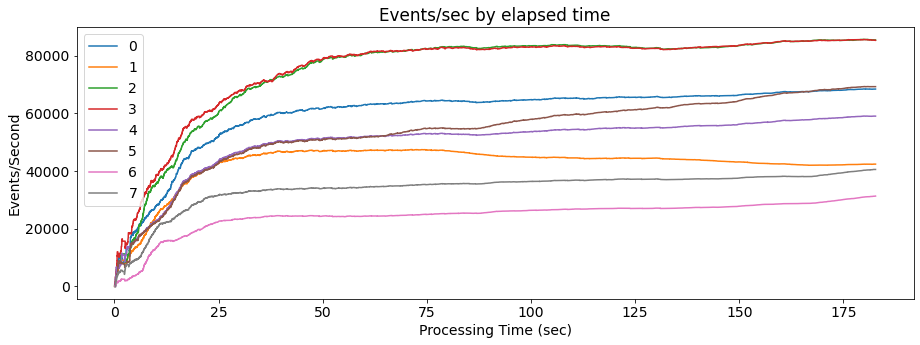

In [5]:
plotThroughput('cluster/throughput/throughput_e10_k8_rb_w.txt', 8)

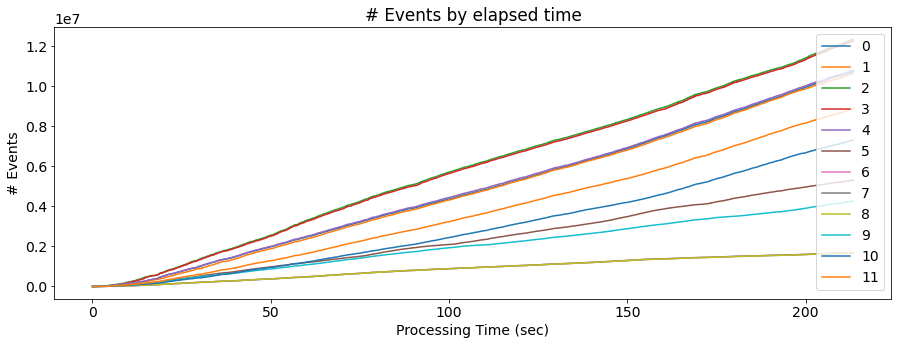

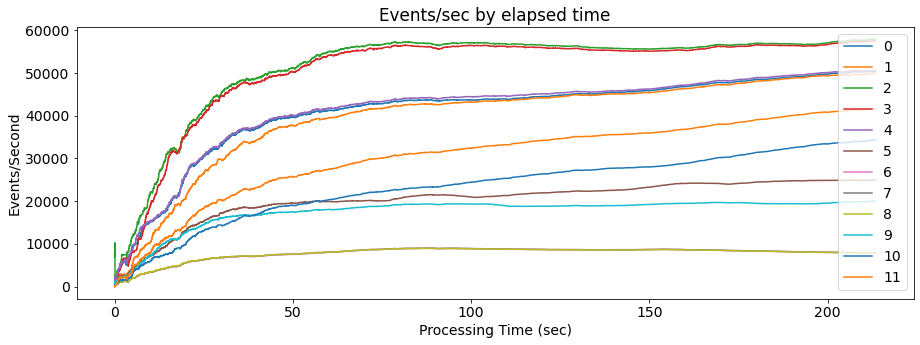

In [6]:
plotThroughput('cluster/throughput/throughput_e10_k12_rb_w.txt', 12)

In [7]:
plotThroughput('cluster/throughput/throughput_e10_k20_rb_w.txt', 20)